In [1]:
#Lander Borbe

import os
import torchvision.transforms as T
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import imageio
import matplotlib.animation as animation
import cv2
%matplotlib inline

from IPython.display import Image
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image
from google.colab import drive
from skimage.transform import resize
from IPython.display import HTML

drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
root_dir = '/content/drive/My Drive/'
print(os.listdir(root_dir))

['Borbe, Lander H.', 'Meet Recordings', 'Final Req G5', 'TECH', 'Final Project', 'Recording', 'OSDP_Files_BORBE', 'Weekly Reports', 'Kalat', 'Requirements', 'SY21-22 | Summer - OSDP Certificates All Batches v1.gdoc', 'OJT', 'GEE002', 'Not Workable Theories Template.gdoc', 'Marketing & Engineering Requirement DRAFT.gsheet', 'Borbe_Gcash.jpg', 'Borbe_Regform.pdf', 'Proj_Draft', 'Colab Notebooks', 'animefaces', 'cat_faces_dataset']


In [3]:
DATA_DIR = (root_dir + 'cat_faces_dataset/')
print(os.listdir(DATA_DIR))

['cute_cats']


In [4]:
print(os.listdir(DATA_DIR+'cute_cats')[:10])

['cat_1815.png', 'cat_2566.png', 'cat_872.png', 'cat_1784.png', 'cat_1916.png', 'cat_1129.png', 'cat_1627.png', 'cat_730.png', 'cat_1040.png', 'cat_1831.png']


In [5]:
#setting image size and batch size

image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [6]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [7]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [8]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

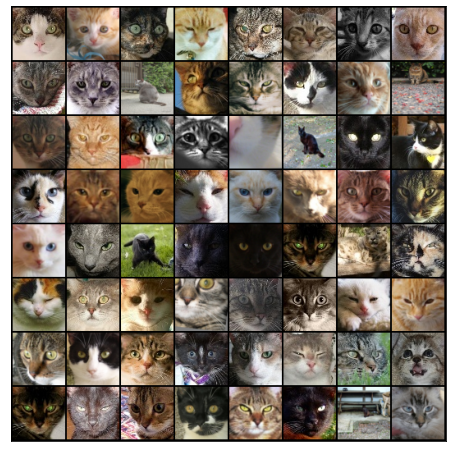

In [9]:
show_batch(train_dl)

In [10]:
#set to gpu

def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [11]:
#check if we are using gpu

device = get_default_device()
device

device(type='cuda')

In [12]:
train_dl = DeviceDataLoader(train_dl, device)

In [13]:
discri = nn.Sequential(

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

    nn.Flatten(),
    nn.Sigmoid())

In [14]:
discri = to_device(discri, device)

In [15]:
latent_size = 128

In [16]:
gen = nn.Sequential(

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

torch.Size([128, 3, 64, 64])


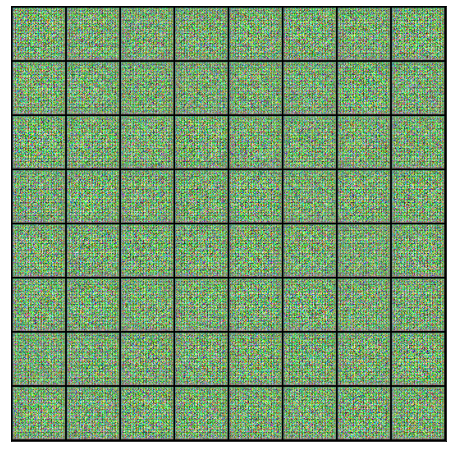

In [17]:
xb = torch.randn(batch_size, latent_size, 1, 1)
fake_images = gen(xb)
print(fake_images.shape)
show_images(fake_images)

In [18]:
gen = to_device(gen, device)

In [19]:
def train_discri(real_images, opt_d):
    opt_d.zero_grad()

    
    real_preds = discri(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    #Generating fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = gen(latent)

  
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discri(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    #Updating weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [20]:
def train_gen(opt_g):

    opt_g.zero_grad()
    
    #Generating fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = gen(latent)
    

    preds = discri(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    #Updating weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [21]:
sample_dir = 'cat_img_generated'
os.makedirs(sample_dir, exist_ok=True)

In [22]:
def save_samples(index, latent_tensors, show=True):
    fake_images = gen(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [23]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


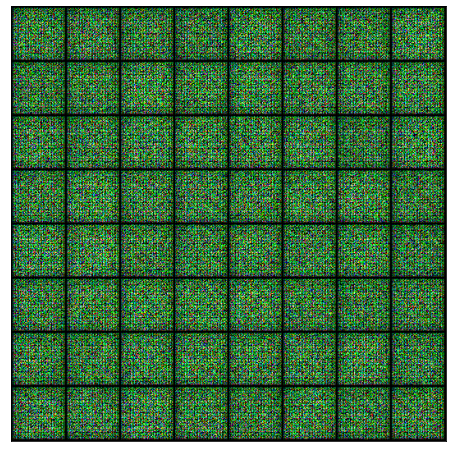

In [24]:
save_samples(0, fixed_latent)

In [25]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    opt_d = torch.optim.Adam(discri.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            loss_d, real_score, fake_score = train_discri(real_images, opt_d)
            loss_g = train_gen(opt_g)
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [26]:
lr = 0.0002
epochs = 100

In [28]:
history = fit(epochs, lr)

  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 4.7780, loss_d: 0.1120, real_score: 0.9504, fake_score: 0.0556
Saving generated-images-0001.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 6.4949, loss_d: 0.1380, real_score: 0.8848, fake_score: 0.0046
Saving generated-images-0002.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 5.1289, loss_d: 0.3303, real_score: 0.8177, fake_score: 0.0676
Saving generated-images-0003.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 6.1011, loss_d: 0.0770, real_score: 0.9379, fake_score: 0.0094
Saving generated-images-0004.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 5.0517, loss_d: 0.1827, real_score: 0.8866, fake_score: 0.0461
Saving generated-images-0005.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 8.9777, loss_d: 0.4100, real_score: 0.9531, fake_score: 0.2739
Saving generated-images-0006.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 4.4838, loss_d: 0.0618, real_score: 0.9599, fake_score: 0.0184
Saving generated-images-0007.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 4.9341, loss_d: 0.0740, real_score: 0.9744, fake_score: 0.0434
Saving generated-images-0008.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.0023, loss_d: 0.2517, real_score: 0.9078, fake_score: 0.1278
Saving generated-images-0009.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.8733, loss_d: 0.1137, real_score: 0.9178, fake_score: 0.0208
Saving generated-images-0010.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 3.7321, loss_d: 0.2619, real_score: 0.9335, fake_score: 0.1484
Saving generated-images-0011.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 4.4510, loss_d: 0.1166, real_score: 0.9338, fake_score: 0.0412
Saving generated-images-0012.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 6.6189, loss_d: 0.2038, real_score: 0.9836, fake_score: 0.1228
Saving generated-images-0013.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 8.0325, loss_d: 0.2566, real_score: 0.9818, fake_score: 0.1866
Saving generated-images-0014.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 6.6451, loss_d: 0.3453, real_score: 0.9986, fake_score: 0.2378
Saving generated-images-0015.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 4.6263, loss_d: 0.1465, real_score: 0.9524, fake_score: 0.0856
Saving generated-images-0016.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 6.3405, loss_d: 0.0375, real_score: 0.9858, fake_score: 0.0221
Saving generated-images-0017.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 6.5181, loss_d: 0.1245, real_score: 0.9785, fake_score: 0.0898
Saving generated-images-0018.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 5.7812, loss_d: 0.0537, real_score: 0.9589, fake_score: 0.0108
Saving generated-images-0019.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 8.6722, loss_d: 0.2490, real_score: 0.9920, fake_score: 0.1957
Saving generated-images-0020.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 3.5626, loss_d: 0.0340, real_score: 0.9948, fake_score: 0.0277
Saving generated-images-0021.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 5.4622, loss_d: 0.1872, real_score: 0.9096, fake_score: 0.0730
Saving generated-images-0022.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 4.8862, loss_d: 0.5744, real_score: 0.6249, fake_score: 0.0023
Saving generated-images-0023.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 6.5478, loss_d: 0.2621, real_score: 0.8021, fake_score: 0.0027
Saving generated-images-0024.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 9.8996, loss_d: 0.9281, real_score: 0.9993, fake_score: 0.4589
Saving generated-images-0025.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 6.3200, loss_d: 0.1068, real_score: 0.9664, fake_score: 0.0609
Saving generated-images-0026.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 5.7114, loss_d: 0.0832, real_score: 0.9361, fake_score: 0.0107
Saving generated-images-0027.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 5.8287, loss_d: 0.1059, real_score: 0.9748, fake_score: 0.0687
Saving generated-images-0028.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 11.8564, loss_d: 0.8473, real_score: 0.9987, fake_score: 0.4726
Saving generated-images-0029.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 5.7041, loss_d: 0.0836, real_score: 0.9374, fake_score: 0.0147
Saving generated-images-0030.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 6.2005, loss_d: 0.0887, real_score: 0.9607, fake_score: 0.0423
Saving generated-images-0031.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 8.5195, loss_d: 0.1413, real_score: 0.8878, fake_score: 0.0027
Saving generated-images-0032.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 6.8695, loss_d: 0.2611, real_score: 0.8063, fake_score: 0.0035
Saving generated-images-0033.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 6.6505, loss_d: 0.1433, real_score: 0.9902, fake_score: 0.1040
Saving generated-images-0034.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 6.5803, loss_d: 0.0435, real_score: 0.9784, fake_score: 0.0204
Saving generated-images-0035.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 5.4811, loss_d: 0.1064, real_score: 0.9832, fake_score: 0.0762
Saving generated-images-0036.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 6.8753, loss_d: 0.3333, real_score: 0.9772, fake_score: 0.2110
Saving generated-images-0037.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 6.1994, loss_d: 0.2388, real_score: 0.9862, fake_score: 0.1673
Saving generated-images-0038.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 5.6143, loss_d: 0.1825, real_score: 0.9307, fake_score: 0.0871
Saving generated-images-0039.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 6.9287, loss_d: 0.2176, real_score: 0.8324, fake_score: 0.0033
Saving generated-images-0040.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 9.3009, loss_d: 0.4962, real_score: 0.9987, fake_score: 0.3255
Saving generated-images-0041.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 4.9452, loss_d: 0.1352, real_score: 0.9463, fake_score: 0.0711
Saving generated-images-0042.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 6.1191, loss_d: 0.1780, real_score: 0.8601, fake_score: 0.0005
Saving generated-images-0043.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 8.7258, loss_d: 0.0223, real_score: 0.9915, fake_score: 0.0133
Saving generated-images-0044.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 6.2781, loss_d: 0.1287, real_score: 0.9802, fake_score: 0.0940
Saving generated-images-0045.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 4.7608, loss_d: 0.0318, real_score: 0.9925, fake_score: 0.0233
Saving generated-images-0046.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 7.3429, loss_d: 0.0711, real_score: 0.9401, fake_score: 0.0042
Saving generated-images-0047.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 4.8114, loss_d: 0.0283, real_score: 0.9898, fake_score: 0.0175
Saving generated-images-0048.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 6.2217, loss_d: 0.0250, real_score: 0.9811, fake_score: 0.0044
Saving generated-images-0049.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 10.3838, loss_d: 0.4501, real_score: 0.9961, fake_score: 0.2947
Saving generated-images-0050.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 5.8203, loss_d: 0.0700, real_score: 0.9682, fake_score: 0.0340
Saving generated-images-0051.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 7.4949, loss_d: 0.1444, real_score: 0.9691, fake_score: 0.0829
Saving generated-images-0052.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 5.3097, loss_d: 0.0501, real_score: 0.9868, fake_score: 0.0348
Saving generated-images-0053.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 7.5968, loss_d: 0.1381, real_score: 0.9568, fake_score: 0.0675
Saving generated-images-0054.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 7.0037, loss_d: 0.0322, real_score: 0.9729, fake_score: 0.0036
Saving generated-images-0055.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 9.0309, loss_d: 0.0879, real_score: 0.9215, fake_score: 0.0005
Saving generated-images-0056.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.8213, loss_d: 0.0655, real_score: 0.9774, fake_score: 0.0390
Saving generated-images-0057.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 5.5017, loss_d: 0.0512, real_score: 0.9581, fake_score: 0.0067
Saving generated-images-0058.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 6.4534, loss_d: 0.0200, real_score: 0.9818, fake_score: 0.0013
Saving generated-images-0059.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 3.5854, loss_d: 2.6493, real_score: 0.2111, fake_score: 0.0001
Saving generated-images-0060.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 6.4227, loss_d: 0.1043, real_score: 0.9746, fake_score: 0.0710
Saving generated-images-0061.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 6.1500, loss_d: 0.0281, real_score: 0.9794, fake_score: 0.0065
Saving generated-images-0062.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 9.8633, loss_d: 0.2214, real_score: 0.9956, fake_score: 0.1672
Saving generated-images-0063.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 10.4749, loss_d: 0.2588, real_score: 0.8352, fake_score: 0.0142
Saving generated-images-0064.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 9.1968, loss_d: 0.0045, real_score: 0.9989, fake_score: 0.0034
Saving generated-images-0065.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 5.4129, loss_d: 0.3977, real_score: 0.7698, fake_score: 0.0484
Saving generated-images-0066.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 5.4426, loss_d: 0.1921, real_score: 0.9053, fake_score: 0.0658
Saving generated-images-0067.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.7984, loss_d: 0.1467, real_score: 0.9586, fake_score: 0.0809
Saving generated-images-0068.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 10.9708, loss_d: 0.5882, real_score: 0.9974, fake_score: 0.3772
Saving generated-images-0069.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 2.4777, loss_d: 0.1104, real_score: 0.9463, fake_score: 0.0441
Saving generated-images-0070.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 5.5683, loss_d: 0.2440, real_score: 0.9607, fake_score: 0.1566
Saving generated-images-0071.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 4.7705, loss_d: 0.0734, real_score: 0.9828, fake_score: 0.0490
Saving generated-images-0072.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 4.9821, loss_d: 0.1181, real_score: 0.9650, fake_score: 0.0733
Saving generated-images-0073.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 6.4082, loss_d: 0.0784, real_score: 0.9345, fake_score: 0.0044
Saving generated-images-0074.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 9.3853, loss_d: 0.0203, real_score: 0.9833, fake_score: 0.0032
Saving generated-images-0075.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 6.2062, loss_d: 0.7326, real_score: 0.5781, fake_score: 0.0013
Saving generated-images-0076.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 8.4552, loss_d: 0.0448, real_score: 0.9604, fake_score: 0.0021
Saving generated-images-0077.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 11.6363, loss_d: 0.2492, real_score: 0.9894, fake_score: 0.1938
Saving generated-images-0078.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 6.1192, loss_d: 0.1282, real_score: 0.9548, fake_score: 0.0684
Saving generated-images-0079.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 5.5625, loss_d: 0.3174, real_score: 0.9177, fake_score: 0.1570
Saving generated-images-0080.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 5.8995, loss_d: 0.0972, real_score: 0.9604, fake_score: 0.0382
Saving generated-images-0081.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 11.0456, loss_d: 0.3880, real_score: 0.9985, fake_score: 0.2744
Saving generated-images-0082.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 5.3271, loss_d: 0.0264, real_score: 0.9987, fake_score: 0.0238
Saving generated-images-0083.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 4.9575, loss_d: 0.0421, real_score: 0.9926, fake_score: 0.0324
Saving generated-images-0084.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 5.7777, loss_d: 0.0516, real_score: 0.9605, fake_score: 0.0088
Saving generated-images-0085.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 6.3817, loss_d: 0.0225, real_score: 0.9882, fake_score: 0.0098
Saving generated-images-0086.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 5.6356, loss_d: 0.0932, real_score: 0.9618, fake_score: 0.0471
Saving generated-images-0087.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 4.5261, loss_d: 0.0698, real_score: 0.9933, fake_score: 0.0512
Saving generated-images-0088.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 5.2606, loss_d: 0.0354, real_score: 0.9742, fake_score: 0.0079
Saving generated-images-0089.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 5.9392, loss_d: 0.3360, real_score: 0.9685, fake_score: 0.2163
Saving generated-images-0090.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 5.5649, loss_d: 0.2012, real_score: 0.9036, fake_score: 0.0729
Saving generated-images-0091.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.8170, loss_d: 0.0918, real_score: 0.9400, fake_score: 0.0167
Saving generated-images-0092.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 4.8038, loss_d: 0.1354, real_score: 0.9368, fake_score: 0.0577
Saving generated-images-0093.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 6.2542, loss_d: 0.0176, real_score: 0.9888, fake_score: 0.0053
Saving generated-images-0094.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 5.3125, loss_d: 0.1690, real_score: 0.9170, fake_score: 0.0539
Saving generated-images-0095.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 7.1386, loss_d: 0.0865, real_score: 0.9326, fake_score: 0.0102
Saving generated-images-0096.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 6.3056, loss_d: 0.0927, real_score: 0.9861, fake_score: 0.0707
Saving generated-images-0097.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 5.3372, loss_d: 0.0418, real_score: 0.9714, fake_score: 0.0103
Saving generated-images-0098.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 5.2475, loss_d: 0.0188, real_score: 0.9878, fake_score: 0.0062
Saving generated-images-0099.png


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 6.3392, loss_d: 0.1385, real_score: 0.9992, fake_score: 0.1064
Saving generated-images-0100.png


In [29]:
losses_g, losses_d, real_scores, fake_scores = history

In [30]:
torch.save(gen.state_dict(), 'Generated.pth')
torch.save(discri.state_dict(), 'Discri.pth')

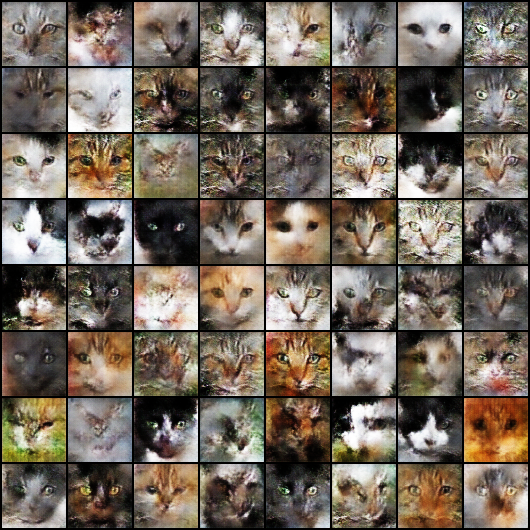

In [47]:
Image('./cat_img_generated/generated-images-0005.png')

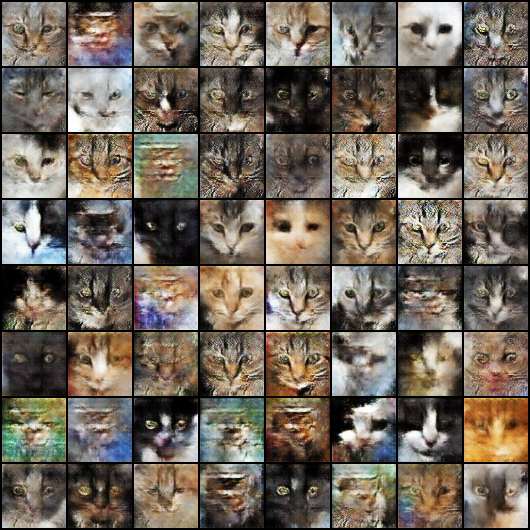

In [31]:
Image('./cat_img_generated/generated-images-0020.png')

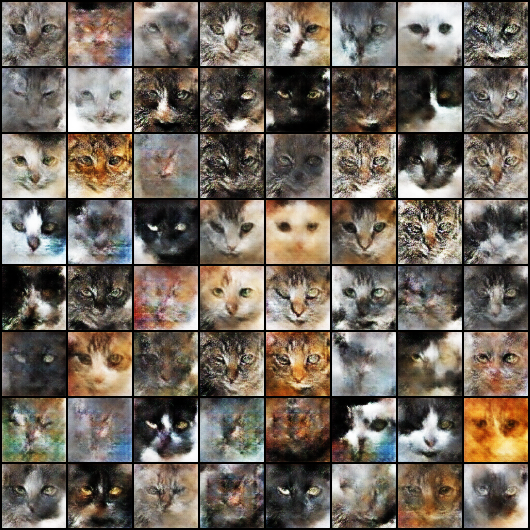

In [32]:
Image('./cat_img_generated/generated-images-0030.png')

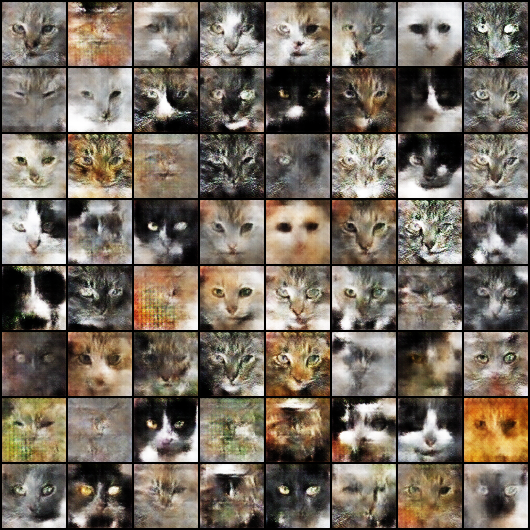

In [33]:
Image('./cat_img_generated/generated-images-0040.png')

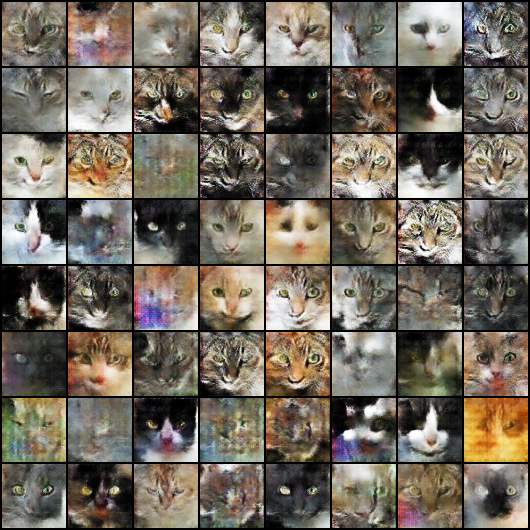

In [34]:
Image('./cat_img_generated/generated-images-0050.png')

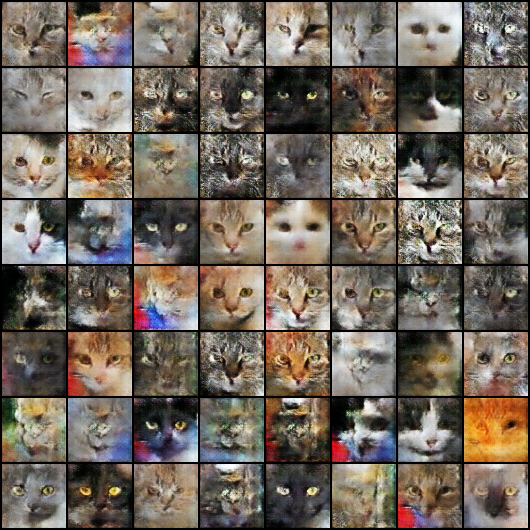

In [35]:
Image('./cat_img_generated/generated-images-0060.png')

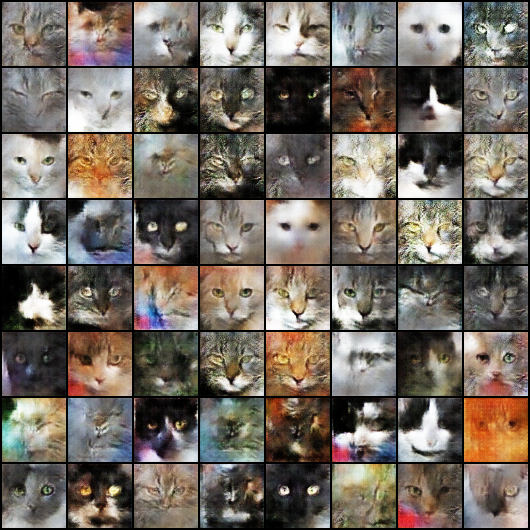

In [36]:
Image('./cat_img_generated/generated-images-0070.png')

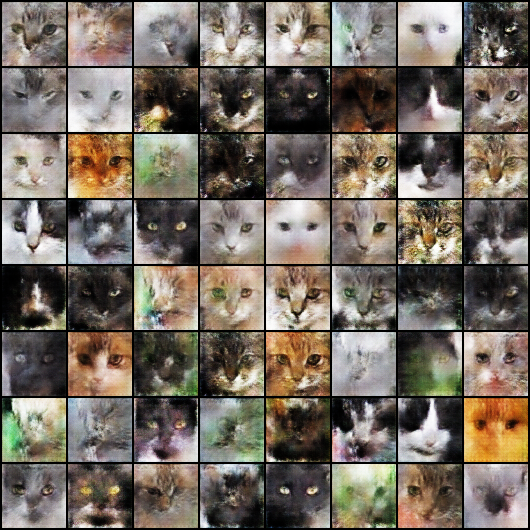

In [37]:
Image('./cat_img_generated/generated-images-0080.png')

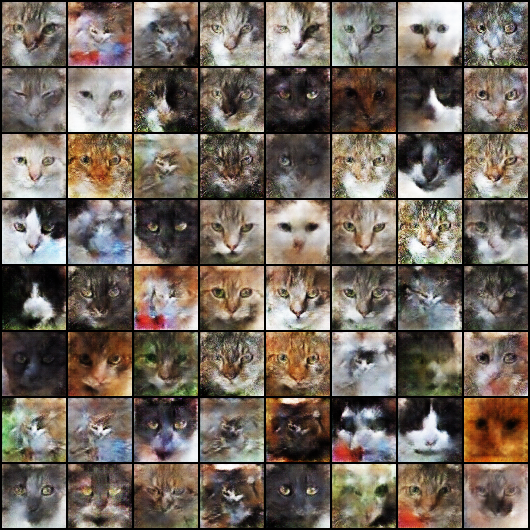

In [38]:
Image('./cat_img_generated/generated-images-0090.png')

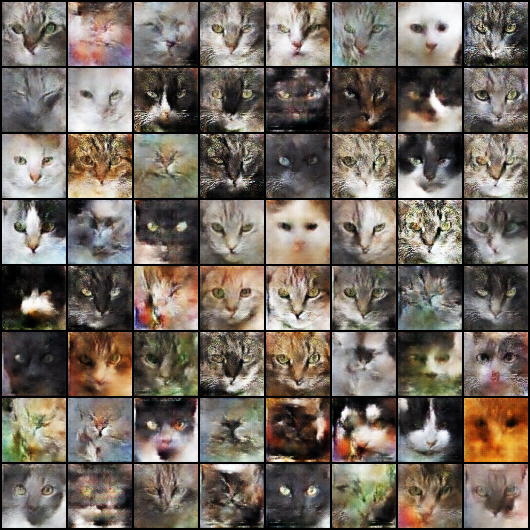

In [43]:
Image('./cat_img_generated/generated-images-0100.png')

In [44]:
#Creating video from the outputs

video_fname = 'gan_train_catz.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(video_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

In [45]:
#Displaying video of progress


def display_video(video):
  fig = plt.figure(figsize=(10,10))
  mov=[]
  for i in range(len(video)):
    img = plt.imshow(video[i],animated = True)
    mov.append([img])

  anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)
  plt.close
  return anime

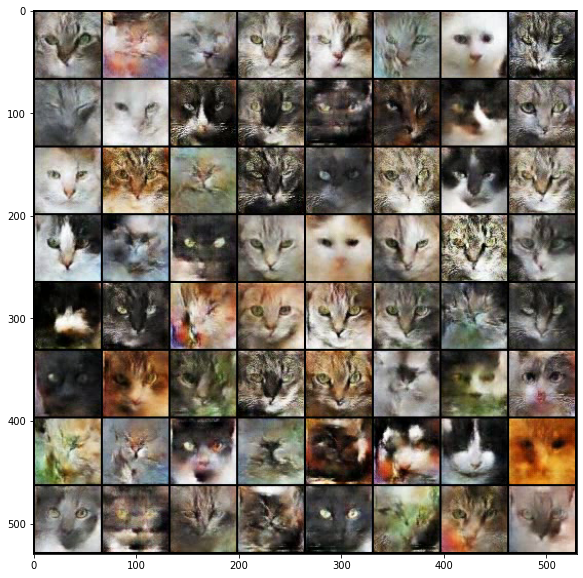

In [46]:
video = imageio.mimread('gan_train_catz.avi')
HTML(display_video(video).to_html5_video())